# Objectif du projet: 
- Prédire les émissions de CO2 et la consommation totale d’énergie de bâtiments pour lesquels elles n’ont pas encore été mesurées pour la ville de Seattle


# Liste et descriptions des colonnes
### OSEBuildingIDA
identifiant unique attribué à chaque propriété couverte par le Seattle Benchmarking Ordinance à des fins de suivi et d'identification.
### DataYear
BuildingTypeCity of Seattle
building type classification.

### PrimaryPropertyType
Utilisation principale d'une propriété (p. Ex. Bureau, magasin de détail).
L'utilisation principale est définie comme une fonction qui représente plus de 50% d'une propriété.Il s'agit du champ Type de propriété - Calculé par l'EPA de Portfolio Manager.
### PropertyName
Official or common property name.

TaxParcelIdentificationNumber
Property King County PIN

### Location
CouncilDistrictCode
Property City of Seattle council district.

### YearBuiltYear
Dans lequel une propriété a été construite ou a subi une rénovation complète.

### PropertyGFATotal
Superficie brute totale du bâtiment et du stationnement.
### PropertyGFAParking

Espace total en pieds carrés de tous les types de stationnement (entièrement clos, partiellement clos et ouvert).

### PropertyGFABuilding(s)

Surface totale au sol en pieds carrés entre les surfaces extérieures des murs d’enceinte d’un bâtiment.Cela comprend toutes les zones à l'intérieur du ou des bâtiments, telles que l'espace des locataires, les espaces communs, les cages d'escalier, les sous-sols, le stockage, etc.


### ENERGYSTARScore

Un EPA a calculé une cote de 1 à 100 qui évalue la performance énergétique globale d'une propriété, sur la base de données nationales pour contrôler les différences entre le climat, les utilisations du bâtiment et les opérations.Un score de 50 représente la médiane nationale.

###  SiteEUI(kBtu/sf)

L'intensité énergétique du site (IUE) est la consommation énergétique du site d'un établissement divisée par sa surface de plancher brute.La consommation d'énergie du site est la quantité annuelle de toute l'énergie consommée par la propriété sur place, comme indiqué sur les factures de services publics.L'IUE du site est mesurée en milliers d'unités thermiques britanniques (kBtu) par pied carré.

### SiteEUIWN(kBtu/sf)


L'intensité d'utilisation de l'énergie du site normalisée selon les conditions météorologiques (WN) correspond à l'énergie du site WN d'une propriété divisée par sa surface de plancher brute (en pieds carrés).L'énergie du site WN est la consommation d'énergie du site que la propriété aurait consommée pendant 30 ans dans des conditions météorologiques moyennes.WN Site EUI est mesuré en mesuré en milliers d'unités thermiques britanniques (kBtu) par pied carré.

### SourceEUI(kBtu/sf)

L'intensité d'utilisation de l'énergie à la source (IUE) est la consommation d'énergie à la source d'une propriété divisée par sa surface de plancher brute.La consommation d'énergie à la source est l'énergie annuelle utilisée pour faire fonctionner la propriété, y compris les pertes liées à la production, au transport et à la distribution.La source EUI est mesurée en milliers d'unités thermiques britanniques (kBtu) par pied carré.

### SourceEUIWN(kBtu/sf)

L'intensité d'utilisation de l'énergie à la source normalisée selon les conditions météorologiques (WN) est la source d'énergie WN d'une propriété divisée par sa surface de plancher brute.L'énergie source WN est la consommation d'énergie source que la propriété aurait consommée pendant 30 ans dans des conditions météorologiques moyennes.WN Source EUI est mesuré en mesuré en milliers d'unités thermiques britanniques (kBtu) par pied carré.

### SiteEnergyUse(kBtu)
La quantité annuelle d'énergie consommée par la propriété à partir de toutes les sources d'énergie.

### SteamUse(kBtu)
La quantité annuelle de vapeur de quartier consommée par la propriété sur place, mesurée en milliers d'unités thermiques britanniques (kBtu).

### Electricity(kWh)
La quantité annuelle d'électricité consommée par la propriété sur place, y compris l'électricité achetée au réseau et produite par des systèmes renouvelables sur place, mesurée en kWh.
### Electricity(kBtu)
La quantité annuelle d'électricité consommée par la propriété sur place, y compris l'électricité achetée au réseau et produite par des systèmes renouvelables sur place, mesurée en milliers d'unités thermiques britanniques (kBtu).

### NaturalGas(therms)

La quantité annuelle de gaz naturel fourni par le service public consommée par la propriété, mesurée en therm


### GHGEmissions(MetricTonsCO2e)

La quantité totale d'émissions de gaz à effet de serre, y compris les émissions de dioxyde de carbone, de méthane et d'oxyde nitreux rejetées dans l'atmosphère en raison de la consommation d'énergie de la propriété, mesurée en tonnes métriques d'équivalent en dioxyde de carbone. Ce calcul utilise un facteur d'émissions de GES du portefeuille de ressources génératrices de Seattle CIty Light. Ceci utilise le facteur d'émissions 2015 de Seattle City Light de 52,44 livres CO2e / MWh. Facteur de vapeur Enwave = 170.17 lb CO2e / MMBtu. Facteur gaz provenant de EPA Portfolio Manager = 53,11 kg CO2e / MBtu.

###  GHGEmissionsIntensity(kgCO2e/ft2)

Total des émissions de gaz à effet de serre divisé par la surface de plancher brute de la propriété, mesurée en kilogrammes d'équivalent en dioxyde de carbone par pied carré. Ce calcul utilise un facteur d'émissions de GES du portefeuille de ressources génératrices de Seattle City Light


In [12]:
# main libraries
import pandas as pd
import numpy as np
#import time
# visual libraries
from matplotlib import pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D 
plt.style.use('ggplot')
# sklearn libraries
from sklearn import preprocessing , decomposition , neighbors
from sklearn import neighbors
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import normalize
from sklearn.metrics import confusion_matrix,accuracy_score,precision_score,recall_score,f1_score,matthews_corrcoef,classification_report,roc_curve
from sklearn.externals import joblib
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

#scipy libraries
from scipy import stats
from scipy.stats import chi2_contingency


from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical

import random
import warnings
warnings.filterwarnings('ignore')


import plotly.graph_objects as go
import plotly.offline as po
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
#import dash
import plotly.express as px
import random
import plotly.figure_factory as ff

In [13]:
data_2015=pd.read_csv('2015-building-energy-benchmarking.csv')
data_2016= pd.read_csv('2016-building-energy-benchmarking.csv')
pd.set_option('display.max_columns', None)
data_2015.head(3)


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,TaxParcelIdentificationNumber,Location,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),OtherFuelUse(kBtu),GHGEmissions(MetricTonsCO2e),GHGEmissionsIntensity(kgCO2e/ft2),DefaultData,Comment,ComplianceStatus,Outlier,2010 Census Tracts,Seattle Police Department Micro Community Policing Plan Areas,City Council Districts,SPD Beats,Zip Codes
0,1,2015,NonResidential,Hotel,MAYFLOWER PARK HOTEL,659000030,"{'latitude': '47.61219025', 'longitude': '-122...",7,DOWNTOWN,1927,1,12.0,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,65.0,78.9,80.3,173.5,175.1,6981428.0,7097539.0,2023032.0,1080307.0,3686160.0,12724.0,1272388.0,0.0,249.43,2.64,No,NaN,Compliant,NaN,NaN,14.0,NaN,31.0,18081
1,2,2015,NonResidential,Hotel,PARAMOUNT HOTEL,659000220,"{'latitude': '47.61310583', 'longitude': '-122...",7,DOWNTOWN,1996,1,11.0,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,51.0,94.4,99.0,191.3,195.2,8354235.0,8765788.0,0.0,1144563.0,3905411.0,44490.0,4448985.0,0.0,263.51,2.38,No,NaN,Compliant,NaN,NaN,14.0,NaN,31.0,18081
2,3,2015,NonResidential,Hotel,WESTIN HOTEL,659000475,"{'latitude': '47.61334897', 'longitude': '-122...",7,DOWNTOWN,1969,1,41.0,961990,0,961990,"Hotel, Parking, Swimming Pool",Hotel,757243.0,Parking,100000.0,Swimming Pool,0.0,NaN,18.0,96.6,99.7,242.7,246.5,73130656.0,75506272.0,19660404.0,14583930.0,49762435.0,37099.0,3709900.0,0.0,2061.48,1.92,Yes,NaN,Compliant,NaN,NaN,56.0,NaN,31.0,18081


Skewness: 17.121821
Kurtosis: 401.528520


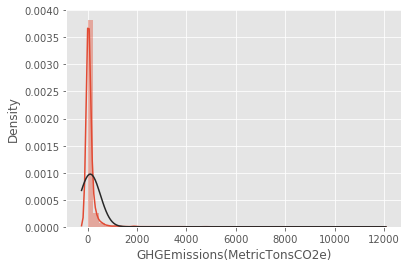

In [14]:
from scipy.stats import norm
#skewness: c'est un coefficient d'asymétrie correspant à une mesure de l'asymetrie de la distribution d'une variable aléatoire réelle 
# puisque skewness=0.00 donc la distribution est symétrique
# kurtosis= coefficient d'aplatissement 
print("Skewness: %f"% data_2015['GHGEmissions(MetricTonsCO2e)'].skew())
print("Kurtosis: %f"% data_2015['GHGEmissions(MetricTonsCO2e)'].kurt())
# afficher la distribution graphique d'une variable quantitative
#histogram 
sns.distplot(data_2015['GHGEmissions(MetricTonsCO2e)'].dropna(), fit = norm)
plt.show()

In [55]:
print(data_2016.shape, data_2015.shape)
data_2016.head(3)

(3376, 46) (3340, 47)


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),DefaultData,Comments,ComplianceStatus,Outlier,TotalGHGEmissions,GHGEmissionsIntensity
0,1,2016,NonResidential,Hotel,Mayflower park hotel,405 Olive way,Seattle,WA,98101.0,0659000030,7,DOWNTOWN,47.61220,-122.33799,1927,1.0,12,88434,0,88434,Hotel,Hotel,88434.0,NaN,NaN,NaN,NaN,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7226362.5,7456910.0,2003882.0,1.156514e+06,3946027.0,12764.52930,1276453.0,False,NaN,Compliant,NaN,249.98,2.83
1,2,2016,NonResidential,Hotel,Paramount Hotel,724 Pine street,Seattle,WA,98101.0,0659000220,7,DOWNTOWN,47.61317,-122.33393,1996,1.0,11,103566,15064,88502,"Hotel, Parking, Restaurant",Hotel,83880.0,Parking,15064.0,Restaurant,4622.0,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8387933.0,8664479.0,0.0,9.504252e+05,3242851.0,51450.81641,5145082.0,False,NaN,Compliant,NaN,295.86,2.86
2,3,2016,NonResidential,Hotel,5673-The Westin Seattle,1900 5th Avenue,Seattle,WA,98101.0,0659000475,7,DOWNTOWN,47.61393,-122.33810,1969,1.0,41,956110,196718,759392,Hotel,Hotel,756493.0,NaN,NaN,NaN,NaN,NaN,43.0,96.000000,97.699997,241.899994,244.100006,72587024.0,73937112.0,21566554.0,1.451544e+07,49526664.0,14938.00000,1493800.0,False,NaN,Compliant,NaN,2089.28,2.19


In [49]:
import pandas as pd
import pandas_profiling
profile = ProfileReport(data_2016, title='Pandas Profiling Report', explorative=True)
#profile = ProfileReport(data_2016, title='Pandas Profiling Report', html={'style':{'full_width':True}})
profile.to_file(output_file="Pandas Profiling Report - data2016 .html")
profile

Summarize dataset:   0%|          | 0/54 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [52]:
#profile.to_notebook_iframe()

In [4]:
data_2015['ComplianceStatus'].unique(), data_2016['ComplianceStatus'].unique()


(array(['Compliant', 'Not Compliant'], dtype=object),
 array(['Compliant', 'Error - Correct Default Data', 'Missing Data',
        'Non-Compliant'], dtype=object))

In [25]:
data_2016.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3376 entries, 0 to 3375
Data columns (total 43 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   OSEBuildingID                    3376 non-null   int64  
 1   DataYear                         3376 non-null   int64  
 2   BuildingType                     3376 non-null   object 
 3   PrimaryPropertyType              3376 non-null   object 
 4   PropertyName                     3376 non-null   object 
 5   Address                          3376 non-null   object 
 6   City                             3376 non-null   object 
 7   State                            3376 non-null   object 
 8   ZipCode                          3360 non-null   float64
 9   TaxParcelIdentificationNumber    3376 non-null   object 
 10  CouncilDistrictCode              3376 non-null   int64  
 11  Neighborhood                     3376 non-null   object 
 12  Latitude            

In [248]:
data_2016.shape

(3376, 46)

In [251]:
data_2016['City'].unique()

array(['Seattle'], dtype=object)

In [253]:
data_2016['State'].unique()

array(['WA'], dtype=object)

In [44]:
data_2016['Neighborhood'].value_counts()

DOWNTOWN                  573
EAST                      453
MAGNOLIA / QUEEN ANNE     423
GREATER DUWAMISH          375
NORTHEAST                 280
LAKE UNION                251
NORTHWEST                 210
SOUTHWEST                 166
NORTH                     145
BALLARD                   126
CENTRAL                   107
SOUTHEAST                  95
DELRIDGE                   80
North                      42
Central                    27
Northwest                  11
Ballard                     7
Delridge                    4
DELRIDGE NEIGHBORHOODS      1
Name: Neighborhood, dtype: int64

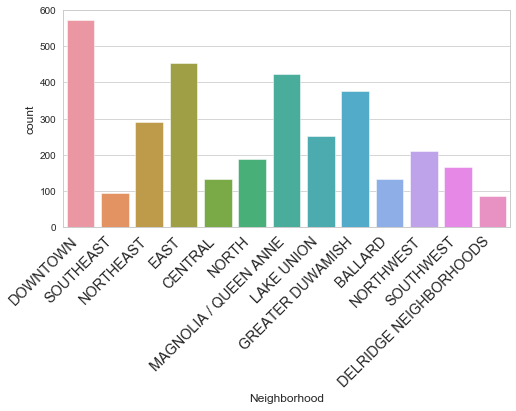

In [56]:
data_2016['Neighborhood']= data_2016['Neighborhood'].replace({'Central':'CENTRAL' ,'Ballard':'BALLARD' , 'North':'NORTH' , 'Delridge': 'DELRIDGE NEIGHBORHOODS', 'DELRIDGE': 'DELRIDGE NEIGHBORHOODS' , 'Northwest':'NORTHEAST'  })

plt.figure(figsize=(8,4))
sns.set_style('whitegrid')
sns.countplot(x='Neighborhood', data=data_2016)
plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large' )
plt.show()

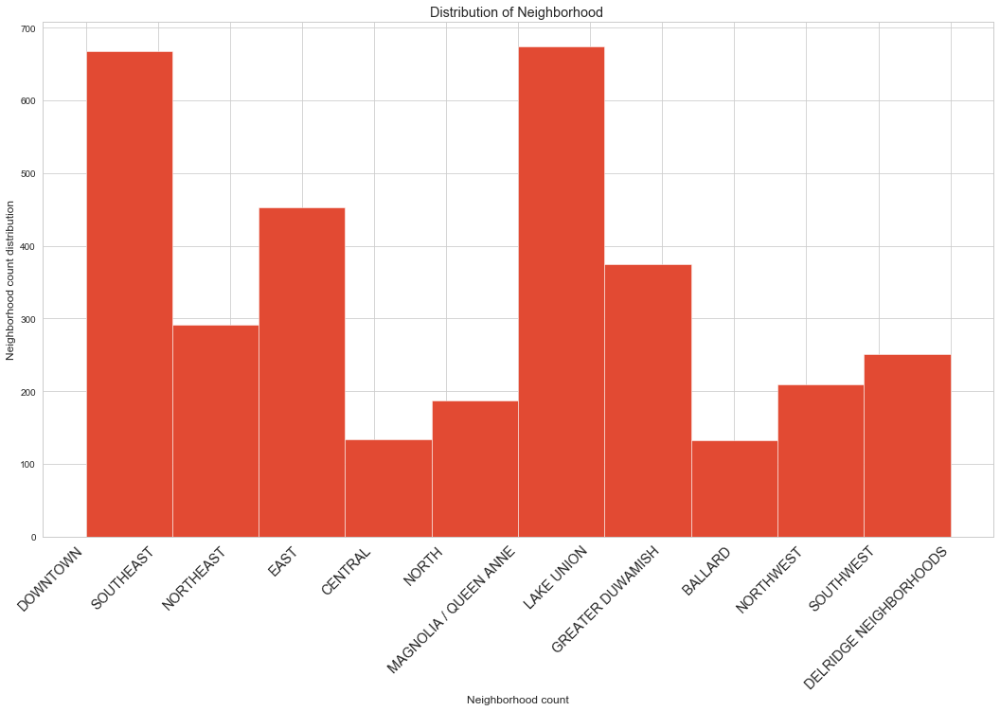

In [57]:
plt.figure(figsize=(18,10))
plt.title("Distribution of Neighborhood ")
plt.xlabel("Neighborhood count")
plt.ylabel("Neighborhood count distribution")
plt.hist(data_2016["Neighborhood"])
plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large' )
plt.show()
plt.show()

In [130]:
data_2016['ComplianceStatus'].unique()

array(['Compliant', 'Error - Correct Default Data', 'Missing Data',
       'Non-Compliant'], dtype=object)

In [260]:
data_2016['BuildingType'].value_counts()

NonResidential          1460
Multifamily LR (1-4)    1018
Multifamily MR (5-9)     580
Multifamily HR (10+)     110
SPS-District K-12         98
Nonresidential COS        85
Campus                    24
Nonresidential WA          1
Name: BuildingType, dtype: int64

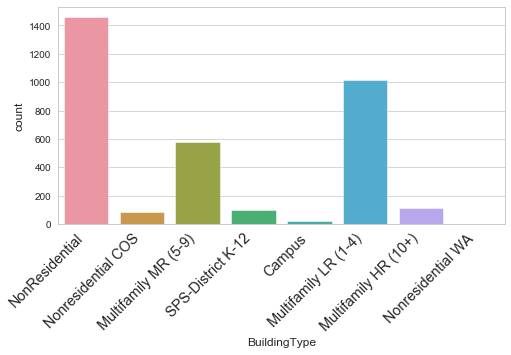

In [168]:
plt.figure(figsize=(8,4))
sns.set_style('whitegrid')
sns.countplot(x='BuildingType', data=data_2016)
plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large' )
plt.show()

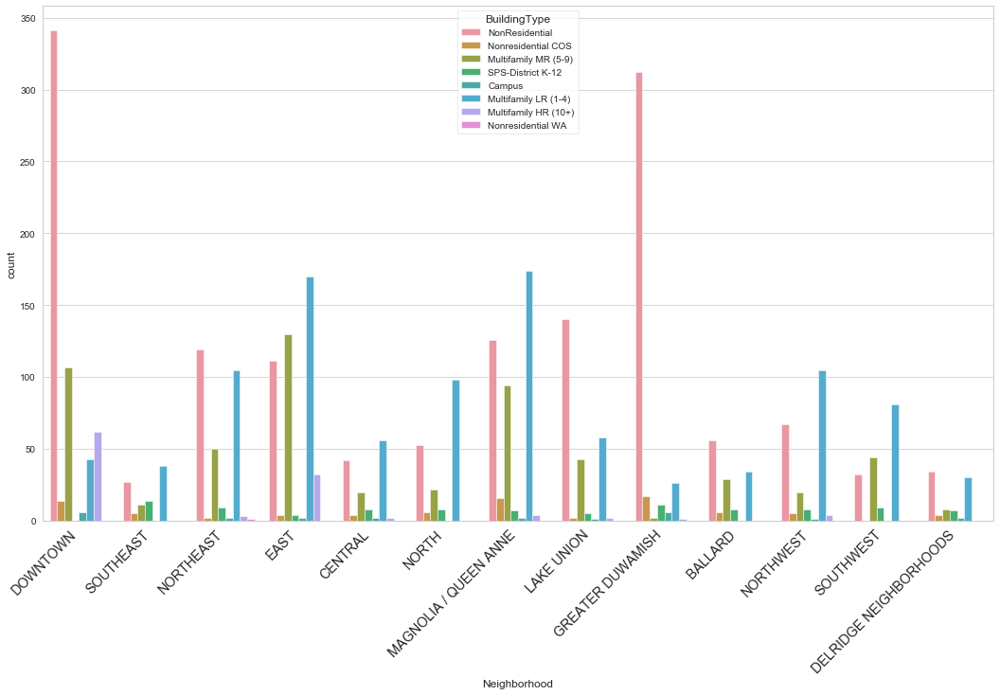

In [214]:
plt.figure(figsize=(18,10))
sns.set_style('whitegrid')
sns.countplot(x='Neighborhood', hue='BuildingType',data=data_2016)
plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large' )
plt.show()

In [262]:
data_2016['ListOfAllPropertyUseTypes'].value_counts()

Multifamily Housing                                                                866
Multifamily Housing, Parking                                                       464
Office                                                                             139
K-12 School                                                                        135
Office, Parking                                                                    120
                                                                                  ... 
Hotel, Parking, Restaurant, Swimming Pool                                            1
Multifamily Housing, Other, Restaurant, Supermarket/Grocery Store                    1
Multifamily Housing, Office, Other - Lodging/Residential, Parking, Retail Store      1
Restaurant, Senior Care Community                                                    1
Police Station                                                                       1
Name: ListOfAllPropertyUseTypes, Length: 46

In [264]:
data_2016['DefaultData'].value_counts()

False    3263
True      113
Name: DefaultData, dtype: int64

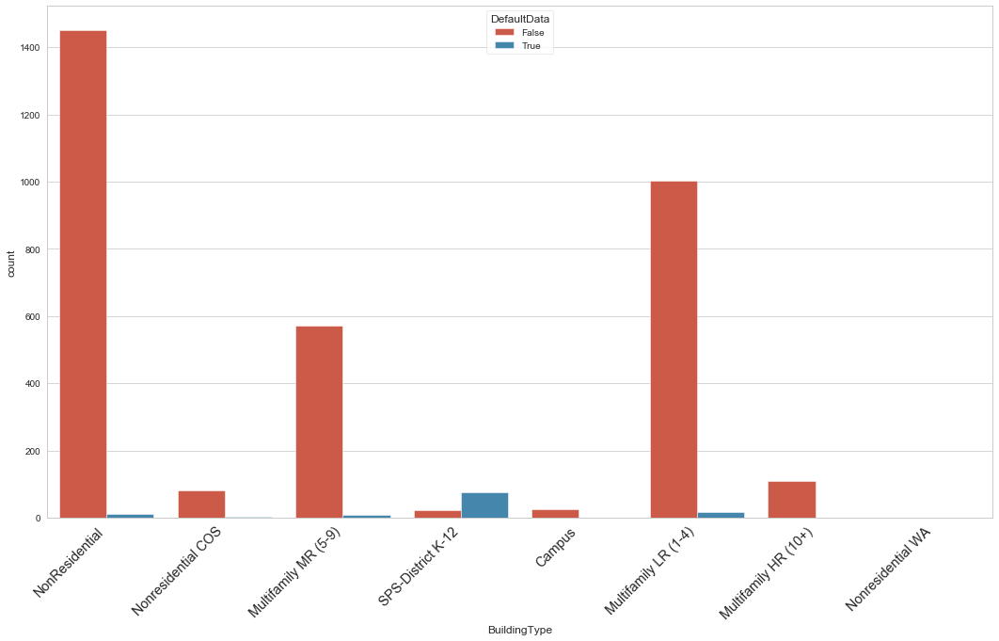

In [215]:
plt.figure(figsize=(18,10))
sns.set_style('whitegrid')
sns.countplot(x='BuildingType', hue='DefaultData',data=data_2016)
plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large' )
plt.show()

In [134]:
data_2016.describe().T

,count,mean,std,min,25%,50%,75%,max
OSEBuildingID,3376.0,2.120899e+04,1.222376e+04,1.00000,19990.750000,2.311200e+04,2.599425e+04,5.022600e+04
DataYear,3376.0,2.016000e+03,0.000000e+00,2016.00000,2016.000000,2.016000e+03,2.016000e+03,2.016000e+03
ZipCode,3360.0,9.811695e+04,1.861520e+01,98006.00000,98105.000000,9.811500e+04,9.812200e+04,9.827200e+04
CouncilDistrictCode,3376.0,4.439277e+00,2.120625e+00,1.00000,3.000000,4.000000e+00,7.000000e+00,7.000000e+00
Latitude,3376.0,4.762403e+01,4.775842e-02,47.49917,47.599860,4.761867e+01,4.765711e+01,4.773387e+01
Longitude,3376.0,-1.223348e+02,2.720329e-02,-122.41425,-122.350662,-1.223325e+02,-1.223194e+02,-1.222210e+02
YearBuilt,3376.0,1.968573e+03,3.308816e+01,1900.00000,1948.000000,1.975000e+03,1.997000e+03,2.015000e+03
NumberofBuildings,3368.0,1.106888e+00,2.108402e+00,0.00000,1.000000,1.000000e+00,1.000000e+00,1.110000e+02
NumberofFloors,3376.0,4.709123e+00,5.494465e+00,0.00000,2.000000,4.000000e+00,5.000000e+00,9.900000e+01
PropertyGFATotal,3376.0,9.483354e+04,2.188376e+05,11285.00000,28487.000000,4.417500e+04,9.099200e+04,9.320156e+06


Text(0.5, 0, 'percentage')

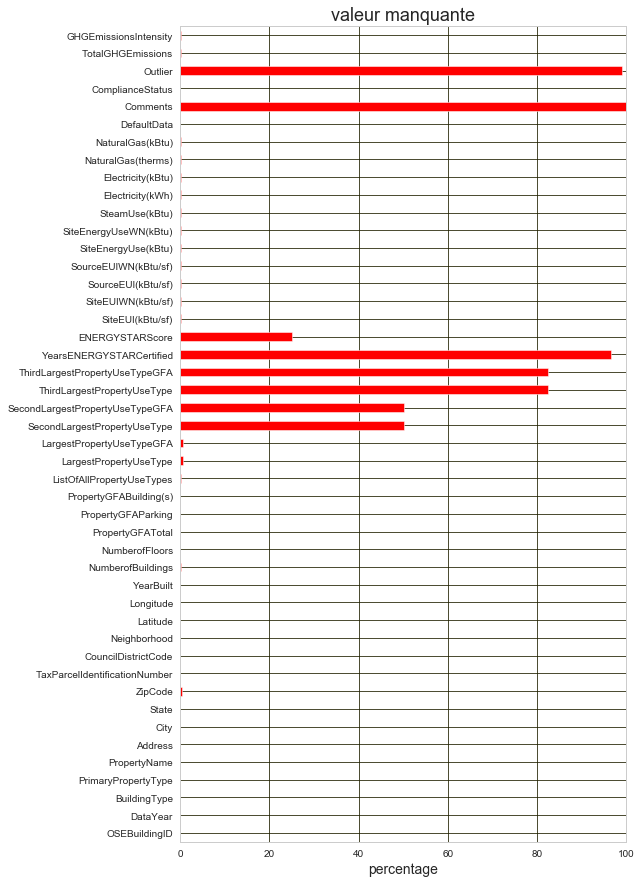

In [7]:
plt.figure(figsize=(8, 15))
plt.rcParams['axes.facecolor']='white'
plt.rc('grid', color='#202000')
(data_2016.isnull().mean(axis=0)*100).plot.barh(color='#FF0000')
plt.xlim(xmax=100)
plt.title('valeur manquante', fontsize=18)
plt.xlabel("percentage", fontsize=14)

In [8]:
total = data_2016.isnull().sum().sort_values(ascending=False)
percent = (data_2016.isnull().sum()/data_2016.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(20)

,Total,Percent
Comments,3376,1.000000
Outlier,3344,0.990521
YearsENERGYSTARCertified,3257,0.964751
ThirdLargestPropertyUseType,2780,0.823460
ThirdLargestPropertyUseTypeGFA,2780,0.823460
SecondLargestPropertyUseType,1697,0.502666
SecondLargestPropertyUseTypeGFA,1697,0.502666
ENERGYSTARScore,843,0.249704
LargestPropertyUseTypeGFA,20,0.005924
LargestPropertyUseType,20,0.005924


In [9]:
#dealing with missing data
data_2016 = data_2016.drop((missing_data[missing_data['Percent'] > 0.90]).index,1)
data_2016.isnull().sum().max() #just checking that there's no missing data missing...
data_2016.shape

(3376, 43)

# distribution de TotalGHGEmissions:

Skewness: 19.481875
Kurtosis: 474.892223


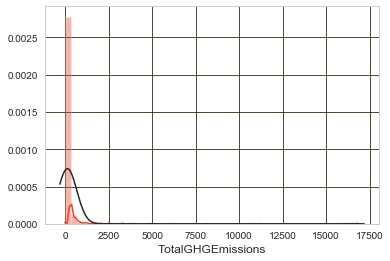

In [10]:
from scipy.stats import norm
#skewness: c'est un coefficient d'asymétrie correspant à une mesure de l'asymetrie de la distribution d'une variable aléatoire réelle 
# puisque skewness=0.00 donc la distribution est symétrique
# kurtosis= coefficient d'aplatissement 
print("Skewness: %f"% data_2016['TotalGHGEmissions'].skew())
print("Kurtosis: %f"% data_2016['TotalGHGEmissions'].kurt())
# afficher la distribution graphique d'une variable quantitative
#histogram 
sns.distplot(data_2016['TotalGHGEmissions'].dropna(), fit = norm)
plt.show()

Skewness: 0.334222
Kurtosis: -0.076276


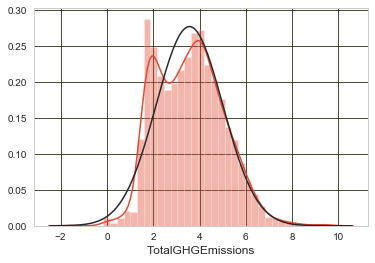

In [11]:
data_2016['TotalGHGEmissions']= np.log1p(data_2016['TotalGHGEmissions'])
print("Skewness: %f"% data_2016['TotalGHGEmissions'].skew())
print("Kurtosis: %f"% data_2016['TotalGHGEmissions'].kurt())
sns.distplot(data_2016['TotalGHGEmissions'].dropna(), fit = norm)
plt.show()

# Distribution de SiteEnergyUse(kBtu):

Skewness: 24.841979
Kurtosis: 858.618481


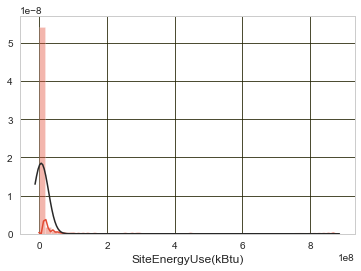

In [12]:
print("Skewness: %f"% data_2016['SiteEnergyUse(kBtu)'].skew())
print("Kurtosis: %f"% data_2016['SiteEnergyUse(kBtu)'].kurt())

sns.distplot(data_2016['SiteEnergyUse(kBtu)'].dropna(), fit = norm)
plt.show()


Skewness: -3.862992
Kurtosis: 37.174931


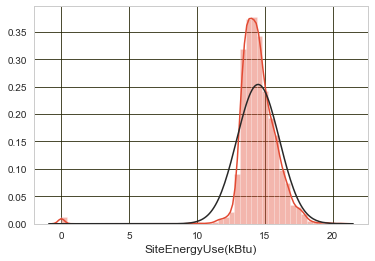

In [13]:
from scipy.stats import boxcox

data_2016['SiteEnergyUse(kBtu)']= np.log1p(data_2016['SiteEnergyUse(kBtu)'])
print("Skewness: %f"% data_2016['SiteEnergyUse(kBtu)'].skew())
print("Kurtosis: %f"% data_2016['SiteEnergyUse(kBtu)'].kurt())
sns.distplot(data_2016['SiteEnergyUse(kBtu)'].dropna(), fit = norm)
plt.show()

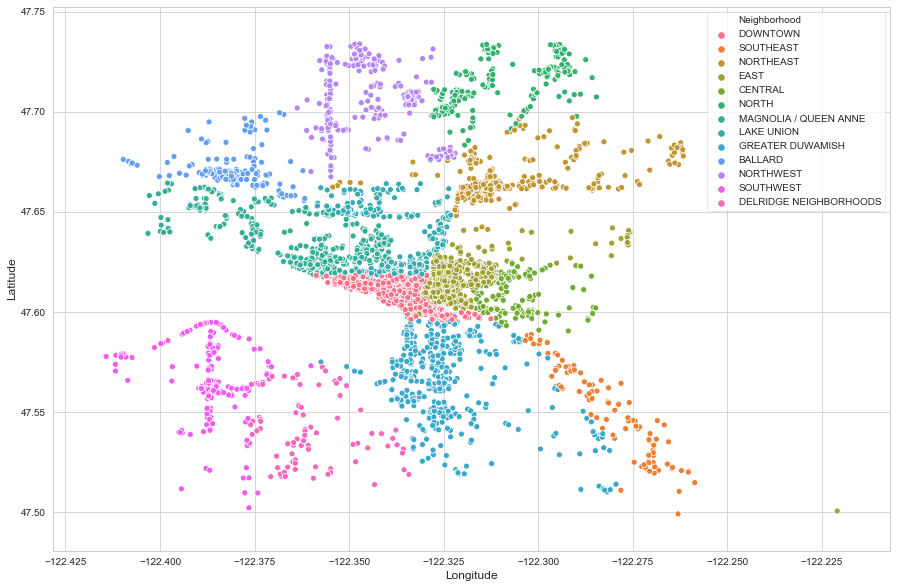

In [221]:
data_2016['Neighborhood']= data_2016['Neighborhood'].replace({'Central':'CENTRAL' ,'Ballard':'BALLARD' , 'North':'NORTH' , 'Delridge': 'DELRIDGE' , 'Northwest':'NORTHEAST'  })

plt.figure(figsize=(15, 10))
sns.scatterplot(x=data_2016.Longitude,y=data_2016.Latitude,hue=data_2016.Neighborhood)
plt.show()

In [178]:
import folium
from folium.plugins import HeatMap

def get_center_latlong(df):
    # get the center of my map for plotting
    centerlat = (df['Latitude'].max() + df['Latitude'].min()) / 2
    centerlong = (df['Longitude'].max() + df['Longitude'].min()) / 2
    return centerlat, centerlong


center = get_center_latlong(data_2016)
m = folium.Map(location=center, zoom_start=10)
# go through each home in set, make circle, and add to map.
#for i in range(len(data_2016)):
 #   folium.Circle(
  #      location=[data_2016.iloc[i]['Latitude'], data_2016.iloc[i]['Longitude']],
   #     radius=10,
    #).add_to(m)

HeatMap(data_2016[['Latitude','Longitude']].dropna(),radius=8,gradient={0.2:'blue',0.4:'purple',0.6:'orange',1.0:'red'}).add_to(m)
display(m)

# Variable qualitative
def pie_plot(feature, data):
    f, ax=plt.subplots(figsize=(15, 10))
    labels = []
    sizes = list(data[feature].value_counts().sort_index())
    explode = [0] * len(sizes)
    explode[sizes.index(max(sizes))] = 0.1
    if feature == 'BuildingType':
        cs = ["green", "lime", "yellow", "orange", "red", "purple", "brown", "pink"]
        labels = ['NonResidential','Multifamily LR (1-4)', 'Multifamily MR (5-9)',
                  'Multifamily HR (10+)','SPS-District K-12' ,'Nonresidential COS' ,'Campus' ,'Nonresidential WA']

    ax.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%', shadow=True, startangle=90, colors=cs)
    ax.axis('equal')
    ax.set_xlabel(feature)   
    plt.show()
    
#pie_plot('BuildingType', data=data_2016)  


In [179]:
building=data_2016['BuildingType'].value_counts()

fig = px.pie(values=building, names=building.index, title='BuildingType')
fig.show()

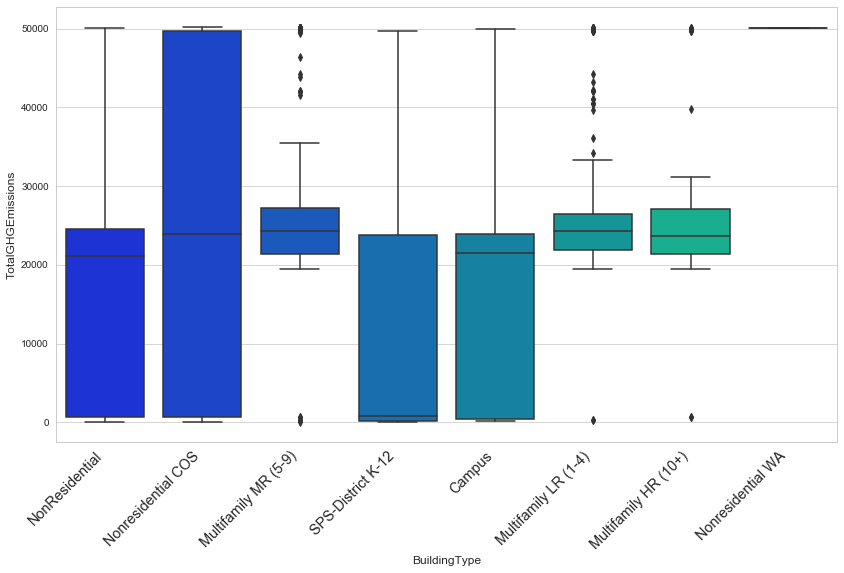

In [223]:
data_2016['TotalGHGEmissions']=data_2016[data_2016['TotalGHGEmissions']<5000]
plt.figure(figsize=(14,8))
sns.boxplot(x='BuildingType', y='TotalGHGEmissions', data=data_2016, palette='winter')
plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large' )
plt.show()

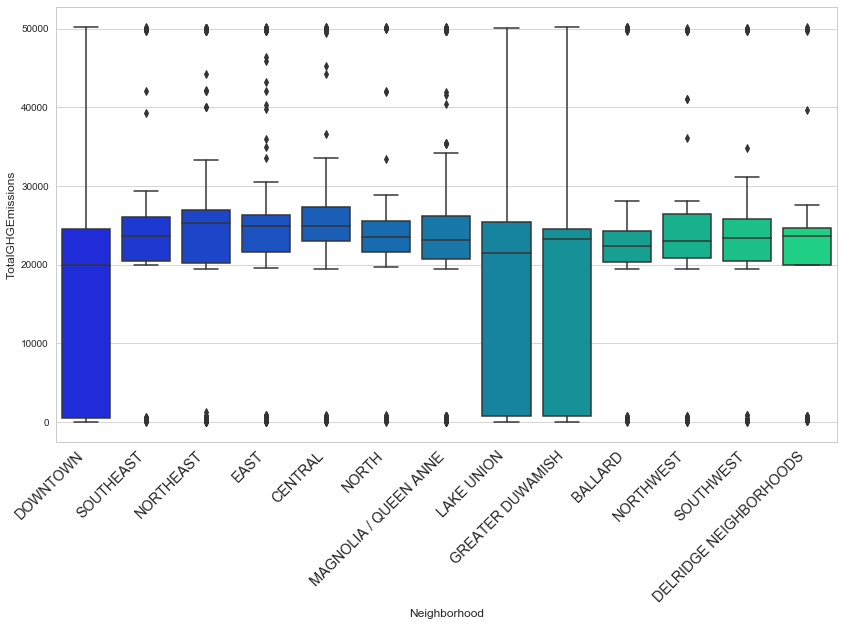

In [224]:
plt.figure(figsize=(14,8))
sns.boxplot(x='Neighborhood', y='TotalGHGEmissions', data=data_2016, palette='winter')
plt.xticks(
    rotation=45, 
    horizontalalignment='right',
    fontweight='light',
    fontsize='x-large' )
plt.show()

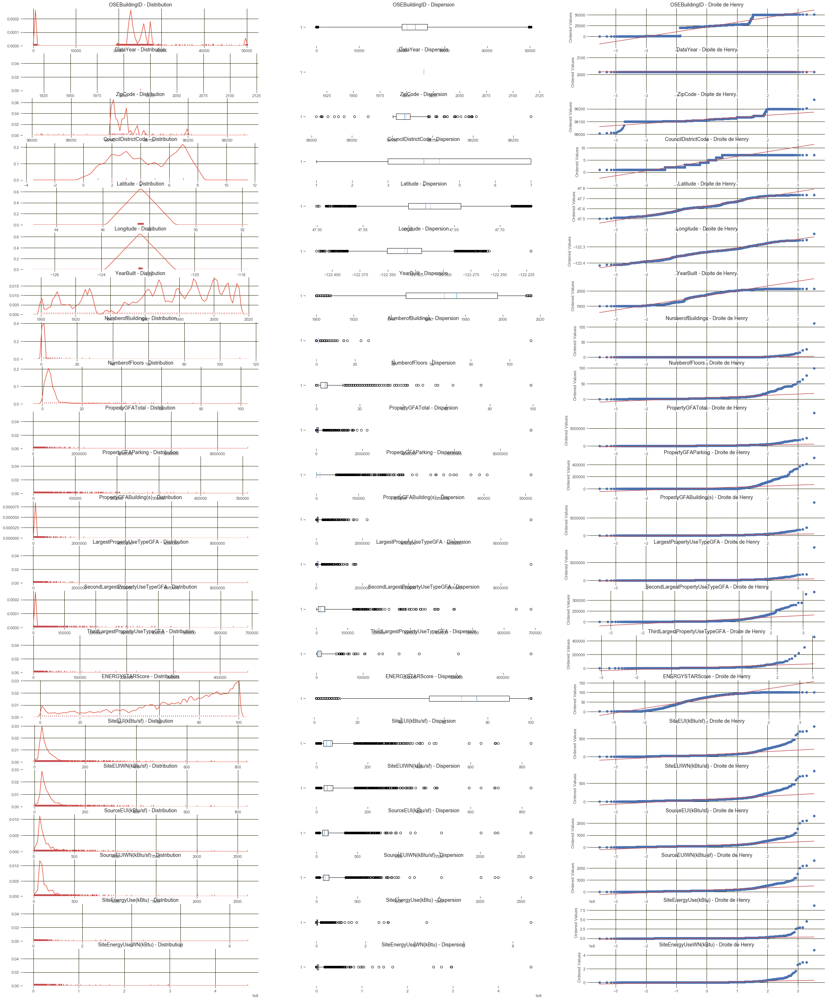

In [159]:
import scipy.stats as stats

nbr_lignes = 22
nbr_colonnes = 3
num_graph = 1

plt.subplots(figsize=(40, 50))

for i in data_2016:
    if data_2016[i].dtype !='object' :
        if num_graph <= nbr_lignes * nbr_colonnes:

            mydata = data_2016[i]
            mydata.dropna(axis=0, inplace=True)

            plt.subplot(nbr_lignes,nbr_colonnes, num_graph)
           # sns.kdeplot(mydata, cumulative=True, bw=1.5)
            sns.distplot(mydata, hist = False, rug = True, rug_kws = {'color' : 'r'}, kde_kws = {'bw' : 1.5, 'kernel' : 'tri'})
            plt.title(i + " - Distribution",size=14)
            plt.xlabel('')

            num_graph +=1

            plt.subplot(nbr_lignes,nbr_colonnes, num_graph)
            plt.boxplot(mydata,whis=[5,95], meanline=True, showmeans=True, vert=False)
            plt.grid()
            plt.title(i + " - Dispersion",size=14)
            num_graph +=1

            plt.subplot(nbr_lignes,nbr_colonnes, num_graph)

            measurements = mydata.to_numpy()
            stats.probplot(measurements, dist="norm", plot=plt)
            plt.title(i + " - Droite de Henry",size=14)
            plt.xlabel('')

            num_graph +=1

            #if i == "GHGEmissionsIntensity":
            #    break

plt.show()


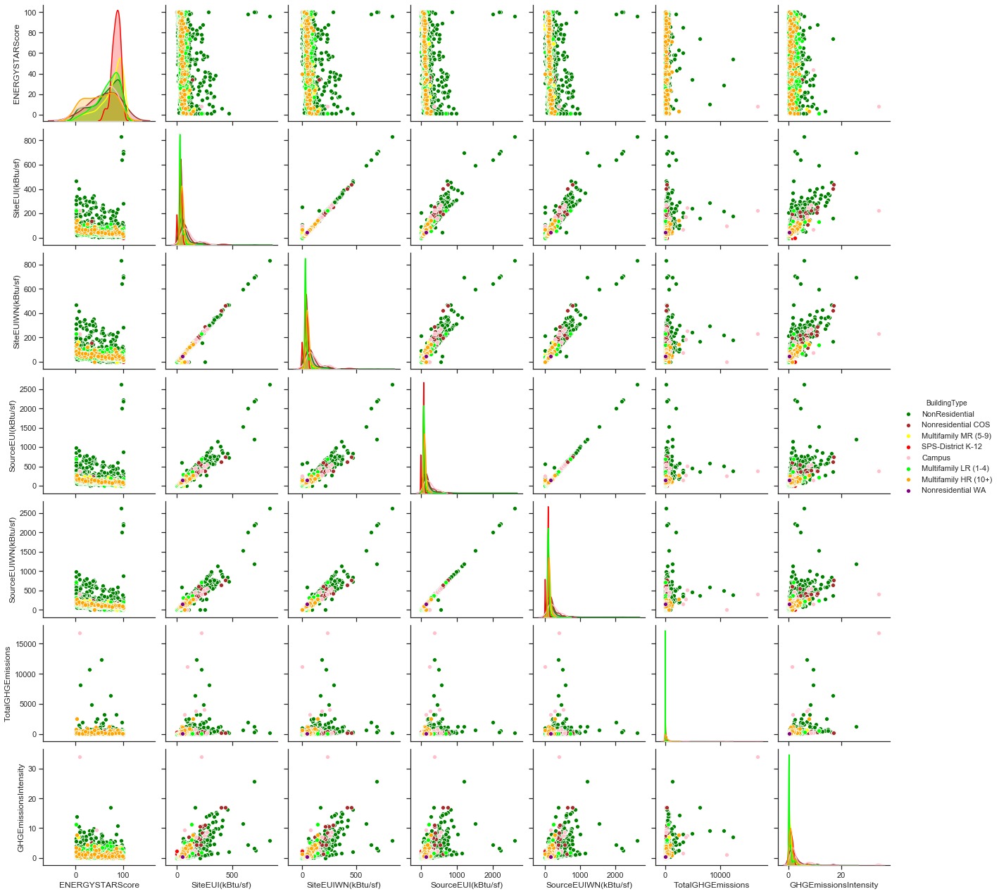

In [184]:
# Corrélation linéaire variables quantitatives
sns.set(style="ticks", color_codes=True)
features=[ 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)','SiteEUIWN(kBtu/sf)', 
          'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)','TotalGHGEmissions', 'GHGEmissionsIntensity']
def pai_plot(features, data):
    g= sns.pairplot(data, vars=features,  hue='BuildingType', palette={'NonResidential':"green", 'Multifamily LR (1-4)':"lime", 'Multifamily MR (5-9)':"yellow",
                                                                       'Multifamily HR (10+)':"orange", 'SPS-District K-12':"red",
                                                                       'Nonresidential COS': "brown", 'Campus':"pink",  'Nonresidential WA': "purple"} )
pai_plot(features, data=data_2016)   

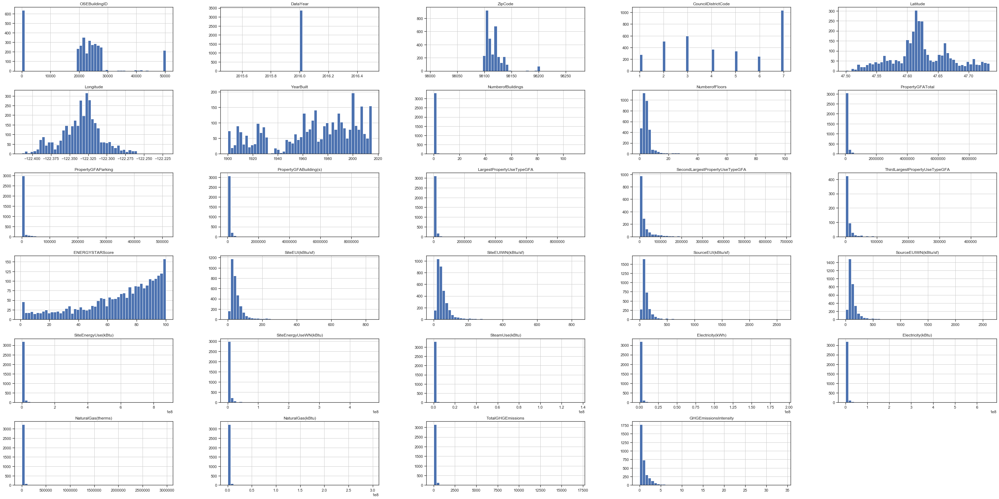

In [190]:
data_hist= data_2016.drop("DefaultData", axis=1, inplace=True)
#data_2016[data_2016['DefaultData']=='False']='No'
#data_2016[data_2016['DefaultData']=='True']='Yes'
#data_2016['DefaultData']= data_2016['DefaultData'].replace({'False': 'No', 'True':'Yes'})
data_2016.hist(bins=50,figsize=(50,25))
plt.show()


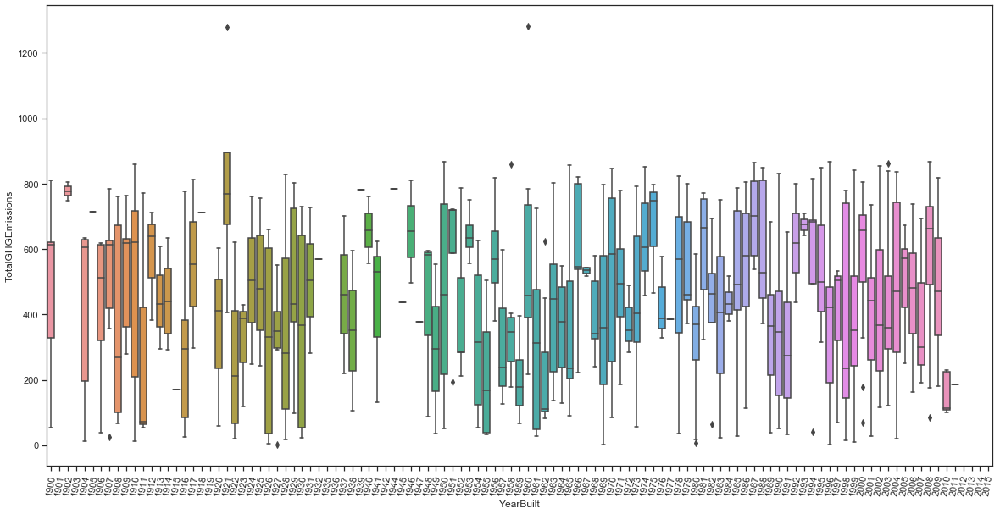

In [195]:
data_2016['TotalGHGEmissions']=data_2016[data_2016['TotalGHGEmissions']<5000]
var = 'YearBuilt'
data = pd.concat([data_2016['TotalGHGEmissions'], data_2016[var]], axis=1)
f, ax = plt.subplots(figsize=(20, 10))
fig = sns.boxplot(x=var, y="TotalGHGEmissions", data=data)
plt.xticks(rotation=80);

# Correlation Between Numeric Features

- For all the numeric features (discrete and continuous) let's check the correlation . I've used the Spearman correlation coefficient, which is more resilient to identifying non-linear relationships than Pearson. I also consider only the absolute value of the coefficient, as I'm interested in finding the strongest relationships, not whether they are positively/negatively correlated.



- Spearman est calculé sur les rangs et décrit ainsi les relations monotones tandis que Pearson est sur les valeurs vraies et décrit les relations linéaires.
-  si vous avez S> P, cela signifie que vous avez une corrélation monotone mais non linéaire.

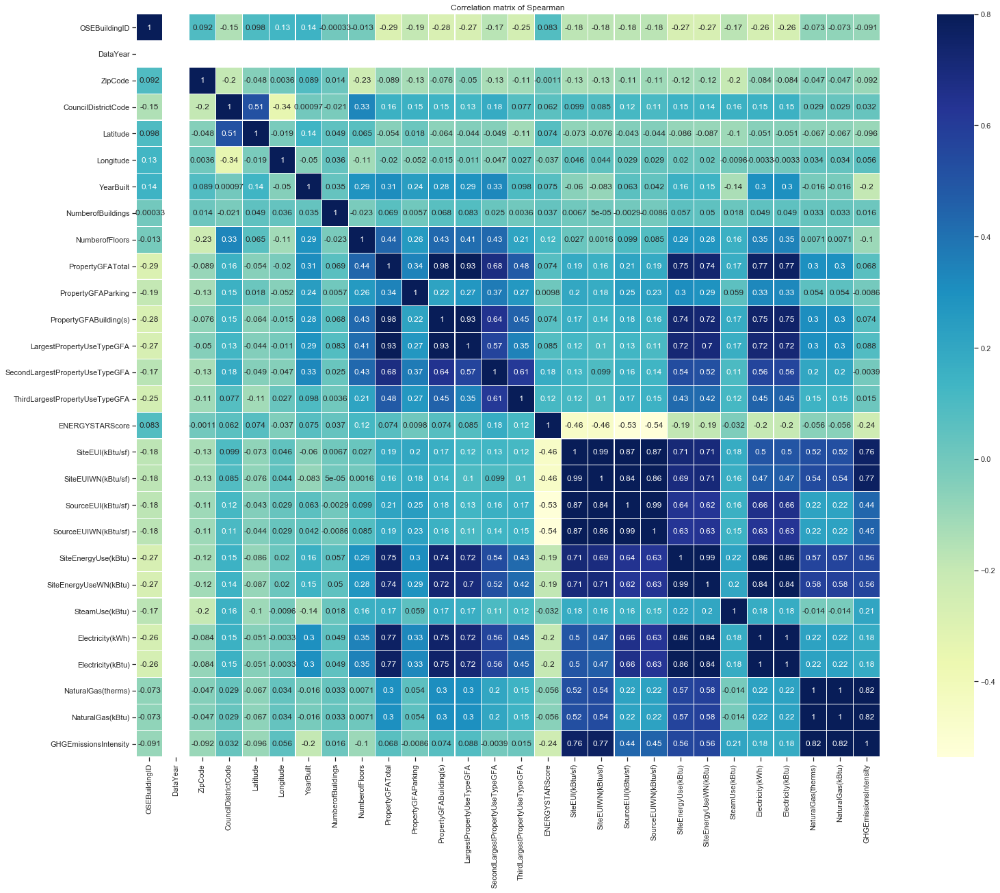

In [199]:
corrmat = data_2016.corr(method='spearman')
f, ax = plt.subplots(figsize=(30, 20))
sns.heatmap(corrmat, ax=ax, cmap="YlGnBu", linewidths=0.1, vmax=.8, square=True, annot=True)
plt.title('Correlation matrix of Spearman')
plt.show()

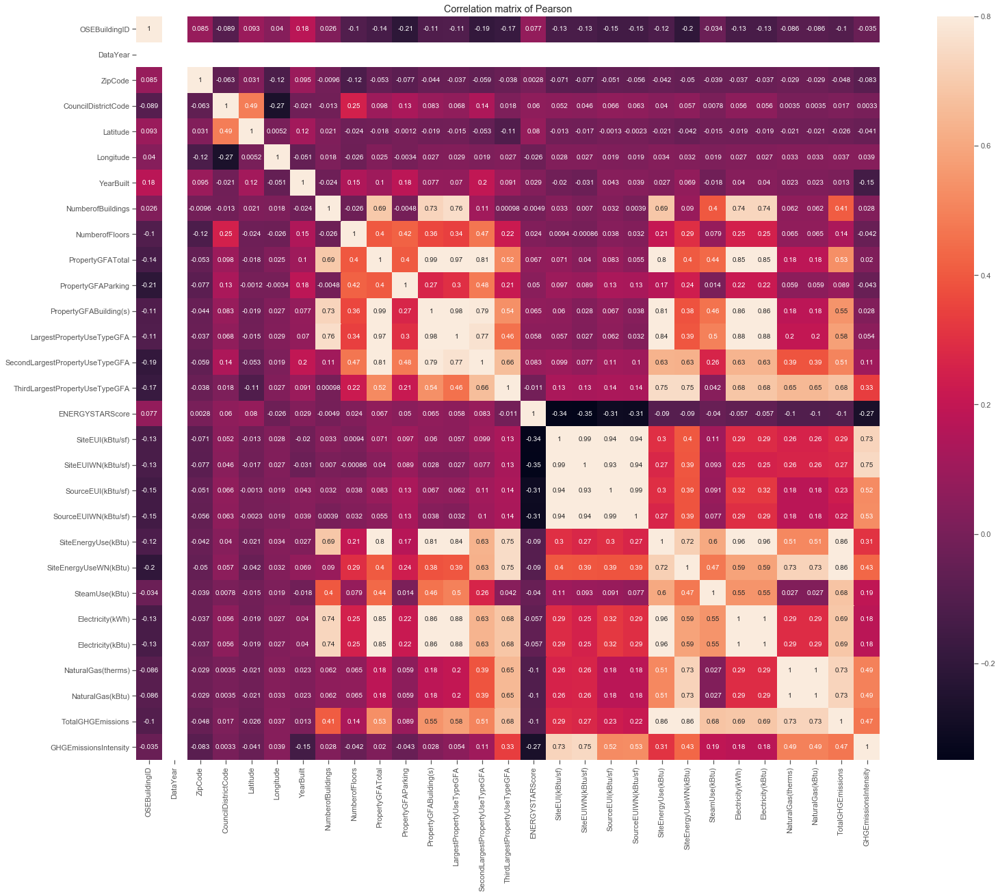

In [192]:
# correlation matrix 
corrmat=data_2016.corr()
f, ax=plt.subplots(figsize=(30, 20))
sns.heatmap(corrmat, vmax=.8, square=True, annot=True)
plt.title('Correlation matrix of Pearson')
plt.show()

(0, 948.7319239301078)

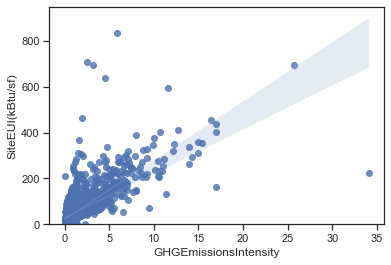

In [201]:
# GHGEmissionsIntensity size as potential predictor variable of 'SiteEUI(kBtu/sf)
sns.regplot(x ='GHGEmissionsIntensity', y = 'SiteEUI(kBtu/sf)', data =data_2016)
plt.ylim(0,)

(0, 1345.0166942604856)

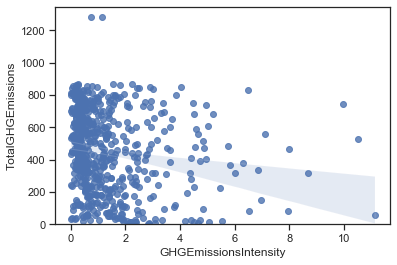

In [202]:
#'SourceEUIWN(kBtu/sf)','TotalGHGEmissions'

# GHGEmissionsIntensity size as potential predictor variable of SourceEUIWN(kBtu/sf)
sns.regplot(x ='GHGEmissionsIntensity', y = 'TotalGHGEmissions', data =data_2016)
plt.ylim(0,)

# Analyse Statistiques:

In [225]:
from scipy.stats import kstest

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.graph_objs as go
#import plotly.plotly as py
init_notebook_mode(connected=True)

# Test de kolmogorov:

- En statistiques, le test de Kolmogorov-Smirnov est un test d'hypothèse utilisé pour déterminer si un échantillon suit bien une loi donnée connue par sa fonction de répartition continue, ou bien si deux échantillons suivent la même loi.


- si  p> 0,05, nous ne pouvons pas rejeter l'hypothèse nulle et les deux distributions sont identiques.

In [204]:
from scipy.stats import kstest

X = data_2016.select_dtypes(include=['int64', 'float64']).columns # quantitative
data_quant=data_2016
data_quant.dropna(axis=0, inplace=True, how="any")

for i in data_quant.columns: 
    if data_quant[i].dtype!='object':
        x = data_quant[i]
        ks_results = kstest(x, cdf='norm')
        print("Features: ",i , ks_results)


Features:  OSEBuildingID KstestResult(statistic=0.9911504424778754, pvalue=2.0098603472814193e-232)
Features:  DataYear KstestResult(statistic=1.0, pvalue=0.0)
Features:  ZipCode KstestResult(statistic=1.0, pvalue=0.0)
Features:  CouncilDistrictCode KstestResult(statistic=0.9772498680518208, pvalue=4.367299136117235e-186)
Features:  Latitude KstestResult(statistic=1.0, pvalue=0.0)
Features:  Longitude KstestResult(statistic=1.0, pvalue=0.0)
Features:  YearBuilt KstestResult(statistic=1.0, pvalue=0.0)
Features:  NumberofBuildings KstestResult(statistic=0.8059465159800474, pvalue=6.0012072084757015e-80)
Features:  NumberofFloors KstestResult(statistic=0.9064534078748296, pvalue=1.0817484875846442e-116)
Features:  PropertyGFATotal KstestResult(statistic=1.0, pvalue=0.0)
Features:  PropertyGFAParking KstestResult(statistic=0.5309734513274336, pvalue=2.919993183295526e-30)
Features:  PropertyGFABuilding(s) KstestResult(statistic=1.0, pvalue=0.0)
Features:  LargestPropertyUseTypeGFA KstestRe

# ANOVA:

In [211]:
#On commence donc par définir nos variables

X = "Neighborhood" # qualitative
Y = data_2016.select_dtypes(include=['int64', 'float64']).columns # quantitative
sub_data = data_2016.sort_values(by=X)
sub_data.dropna(axis=0, inplace=True, how="any")
print(sub_data.shape)
sub_data.head()

(113, 42)


,OSEBuildingID,DataYear,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,TaxParcelIdentificationNumber,CouncilDistrictCode,Neighborhood,Latitude,Longitude,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),ListOfAllPropertyUseTypes,LargestPropertyUseType,LargestPropertyUseTypeGFA,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeGFA,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeGFA,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),ComplianceStatus,TotalGHGEmissions,GHGEmissionsIntensity
331,467,2016,NonResidential,Retail Store,70100608-Ballard,915 NW 45th Street,Seattle,WA,98107.0,1982202070,6,BALLARD,47.66057,-122.36857,1999,1.0,1,164437,0,164437,"Parking, Retail Store, Supermarket/Grocery Store",Retail Store,102653.0,Supermarket/Grocery Store,74102.0,Parking,0.0,62.0,104.000000,107.699997,276.000000,278.000000,18390344.0,19031574.0,0.000,4.132327e+06,14099499.0,42908.433590,4290843.0,Compliant,467,1.98
405,563,2016,NonResidential,Small- and Mid-Sized Office,Darigold HQ,1130 Rainier Ave S,Seattle,WA,98144.0,7132300370,3,CENTRAL,47.59367,-122.30957,1914,1.0,2,62220,0,62220,"Office, Other - Services, Parking",Office,60676.0,Parking,13780.0,Other - Services,1324.0,32.0,87.800003,87.800003,275.299988,275.299988,5444253.5,5444253.5,0.000,1.591860e+06,5431426.0,128.270004,12827.0,Compliant,563,0.62
295,425,2016,NonResidential,Large Office,First and Stewart,101 Stewart Street,Seattle,WA,98101.0,1977200020,7,DOWNTOWN,47.61029,-122.34089,1986,1.0,12,115857,15140,100717,"Office, Parking, Restaurant",Office,104788.0,Parking,11844.0,Restaurant,528.0,89.0,45.200001,45.200001,141.800003,141.800003,4757299.5,4757299.5,0.000,1.394285e+06,4757299.0,0.000000,0.0,Compliant,425,0.29
292,422,2016,NonResidential,Large Office,Two Union Square,601 Union St.,Seattle,WA,98101.0,1976700125,7,DOWNTOWN,47.61043,-122.33206,1989,1.0,56,1605578,389860,1215718,"Office, Other, Parking",Office,1314475.0,Parking,389860.0,Other,30744.0,97.0,36.799999,37.900002,110.300003,113.300003,49517704.0,50984500.0,915654.875,1.350581e+07,46081813.0,25202.298830,2520230.0,Compliant,422,0.33
287,417,2016,NonResidential,Large Office,Melbourne Tower,1511 3rd Ave,Seattle,WA,98101.0,1975700465,7,DOWNTOWN,47.60987,-122.33824,1927,1.0,10,130893,0,130893,"Medical Office, Office, Supermarket/Grocery Store",Office,87925.0,Supermarket/Grocery Store,27177.0,Medical Office,6644.0,80.0,57.200001,58.799999,179.600006,184.800003,6962073.0,7163323.5,0.000,2.040467e+06,6962072.0,0.000000,0.0,Compliant,417,0.37


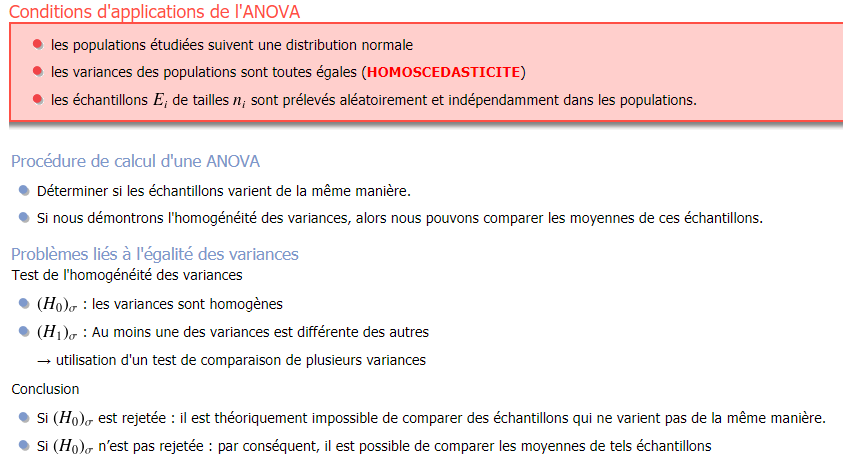

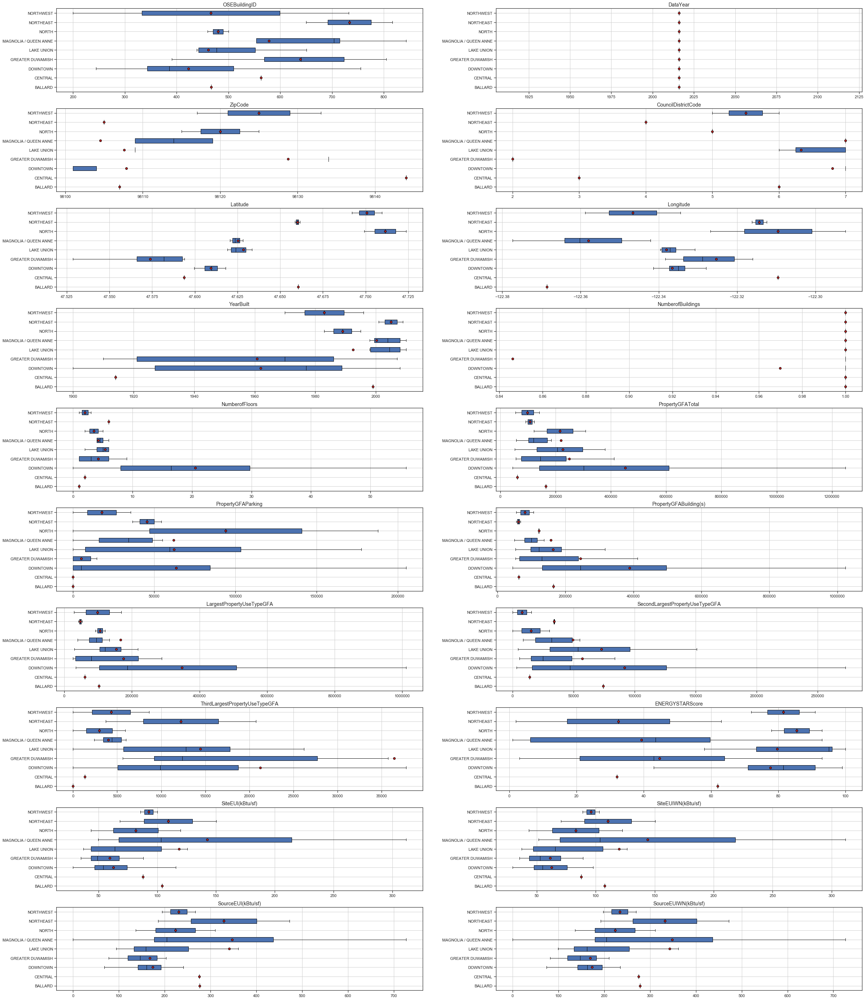

In [212]:
#On analyse donc l'ANOVA pour chaque indicateur
#Pour cela on utilise des boites à moustache

nbr_lignes = 10
nbr_colonnes = 2
num_graph = 1

plt.subplots(figsize=(40, 50))


# Propriétés graphiques   
medianprops = {'color':"black"}
meanprops = {'marker':'o', 'markeredgecolor':'black',
            'markerfacecolor':'firebrick'}

#Cette boucle for trace une boite à moustache pour chaque indicateur analysé
for i in sub_data:
    if sub_data[i].dtypes != "object":
        
        if num_graph <= nbr_lignes * nbr_colonnes:

            grouper = sub_data.groupby(X)[i]
            x = [grouper.get_group(k) for k in grouper.groups]

            plt.subplot(nbr_lignes,nbr_colonnes, num_graph)

            plt.boxplot(x, labels=sub_data[X].unique(), showfliers=False, medianprops=medianprops, 
                        vert=False, patch_artist=True, showmeans=True, meanprops=meanprops)
            plt.grid()

            plt.title(i,size=14)

            num_graph +=1

plt.show()

In [218]:
data_2016['Neighborhood'].unique()

array(['DOWNTOWN', 'LAKE UNION', 'MAGNOLIA / QUEEN ANNE',
       'GREATER DUWAMISH', 'NORTHWEST', 'NORTH', 'BALLARD', 'CENTRAL',
       'NORTHEAST'], dtype=object)

- En statistique, l'analyse de la variance (terme souvent abrégé par le terme anglais ANOVA : analysis of variance) est un ensemble de modèles statistiques utilisés pour vérifier si les moyennes des groupes proviennent d'une même population1. Les groupes correspondent aux modalités d'une variable qualitative  et les moyennes sont calculés à partir d'une variable continue

- Ce test s'applique lorsque l'on mesure une ou plusieurs variables explicatives catégorielle (appelées alors facteurs de variabilité, leurs différentes modalités étant parfois appelées « niveaux ») qui ont de l'influence sur la loi d'une variable continue à expliquer. On parle d'analyse à un facteur lorsque l'analyse porte sur un modèle décrit par un seul facteur de variabilité, d'analyse à deux facteurs ou d'analyse multifactorielle sinon.

-  L'hypothèse nulle correspond au cas où les distributions suivent la même loi normale.

- L'hypothèse alternative est qu'il existe au moins une distribution dont la moyenne s'écarte des autres moyennes :

- L'ANOVA à un facteur teste l'hypothèse nulle selon laquelle deux groupes ou plus ont la même moyenne de population
- Les tests F sont couramment utilisés pour étudier les cas suivants:

- L'hypothèse que les moyennes de différents ensembles de données dont la distribution suit une loi normale, ayant tous le même écart-type, sont égales. Il s'agit du test F le plus connu et il joue un rôle important dans l'analyse de la variance (ANOVA).
- L'hypothèse qu'un modèle de régression proposé convient bien aux données. Voir Manque d'ajustement d'une somme des carrés.
- L'hypothèse que, dans le cas d'une analyse de régression, un jeu de données suit le plus simple des deux modèles linéaires proposés lorsque ces modèles sont imbriqués l'un dans l'autre.

In [217]:
import scipy.stats as stats
F, p = stats.f_oneway(  sub_data[sub_data.Neighborhood=='DOWNTOWN'].TotalGHGEmissions,
                        sub_data[sub_data.Neighborhood=='LAKE UNION'].TotalGHGEmissions,
                        sub_data[sub_data.Neighborhood=='MAGNOLIA / QUEEN ANNE'].TotalGHGEmissions,
                        sub_data[sub_data.Neighborhood=='GREATER DUWAMISH'].TotalGHGEmissions,
                        sub_data[sub_data.Neighborhood=='NORTHWEST'].TotalGHGEmissions,
                        sub_data[sub_data.Neighborhood=='NORTH'].TotalGHGEmissions,
                        sub_data[sub_data.Neighborhood=='BALLARD'].TotalGHGEmissions,
                        sub_data[sub_data.Neighborhood=='CENTRAL'].TotalGHGEmissions,
                        sub_data[sub_data.Neighborhood=='NORTHEAST'].TotalGHGEmissions
                      )
print( 'The F statistic of the test is ',F)
print('The associated p-value from the F distribution is ', p)


The F statistic of the test is  2.0650763552613847
The associated p-value from the F distribution is  0.045852642284606504


## Chi2

- Pour calculer la corrélation entre deux données catégorielles, nous devrons utiliser le test du Chi-carré. 
- L'hypothèse nulle est qu'ils sont indépendants.
- L'hypothèse alternative est qu'ils sont corrélés d'une manière ou d'une autre.

- For testing if two features are independent or not, H0: A and B are independent H1: A and B are dependent

- p < 0.05, then A and B are dependent

In [311]:
from scipy import stats

# Constructing the Contingency Table
result_obs = pd.crosstab(sub_data.Neighborhood, sub_data.BuildingType,margins=True)

# The Chi-Squared test for independence
val_chi2, p_value, deg_of_lbrt, expctd = stats.chi2_contingency(result_obs)

print("La valeur du chi2 est de", val_chi2)
print("La p_value est de :", p_value, ". Soit ", round(p_value*100,2), "%.")
print("Le nombre de degrés de liberté est de :", deg_of_lbrt)
print('')

if round(p_value*100,2) <= 5:
    print("La distribution des résidus n'est pas normale.")
else:
    print("La distribution des résidus est normale.")

La valeur du chi2 est de 168.25416262138612
La p_value est de : 1.39140917489498e-07 . Soit  0.0 %.
Le nombre de degrés de liberté est de : 84

La distribution des résidus n'est pas normale.


# PCA:

In [241]:
# Plot the PCA with either 2 or 3 reduced components
def plotPCA(df, nComponents):
    df = df.select_dtypes(include =[np.number]) # keep only numerical columns
    df = df.dropna('columns') # drop columns with NaN
    if df.shape[1] < nComponents:
        print(f'No PCA graph shown: The number of numeric columns ({df.shape[1]}) is less than the number of PCA components ({nComponents})')
        return
    df = df.astype('int64','float64') # Cast to float for sklearn functions
    df = StandardScaler().fit_transform(df) # Standardize features by removing the mean and scaling to unit variance
    pca = PCA(n_components = nComponents)
    principalComponents = pca.fit_transform(df)
    principalDf = pd.DataFrame(data = principalComponents, columns = ['Principal Component ' + str(i) for i in range(1, nComponents + 1)])
    finalDf= pd.concat([principalDf], axis=1)
    pca2 = decomposition.PCA(n_components=4)
    pca2.fit(df)
   
    return finalDf, principalDf, pca2
    
    
    
    
def plotpca_2_3(principalDf,nComponents ):    
    fig = plt.figure(figsize = (8, 8))
    if (nComponents == 3):
        ax = fig.add_subplot(111, projection = '3d')
        ax.set_xlabel('Principal Component 1', fontsize = 15)
        ax.set_ylabel('Principal Component 2', fontsize = 15)
        ax.set_zlabel('Principal Component 3', fontsize = 15)
        ax.set_title('3 component PCA', fontsize = 20)
        ax.scatter(xs = principalDf.iloc[:, 0], ys = principalDf.iloc[:, 1], zs = principalDf.iloc[:, 2])
    else:
        ax = fig.add_subplot(111)
        ax.set_xlabel('Principal Component 1', fontsize = 15)
        ax.set_ylabel('Principal Component 2', fontsize = 15)
        ax.set_title('2 component PCA', fontsize = 20)
        ax.scatter(x = principalDf.iloc[:, 0], y = principalDf.iloc[:, 1])
        
        
def PCA_plot (components,imp_data,comp1,comp2):
    plt.figure(figsize=(12, 12))
    for i, (x, y) in enumerate(zip(components[comp1, :], components[comp2, :])):
        # Display origine segment (x, y)
        plt.plot([0, x], [0, y], color='#00FFFF')
        
        plt.text(x, y, imp_data.columns[i], fontsize='12', color='#FFFF99')
 
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')
    plt.xlim([-1, 1])
    plt.ylim([-1, 1])
    plt.rcParams['axes.facecolor'] = 'black'
    plt.show()
        
       
finalDf_2, principalDf_2, pca_2= plotPCA(data_2016, 2) # 2D PCA
finalDf_3, principalDf_3, pca_2= plotPCA(data_2016, 3) # 3D PCA

finalDf_2.head()

,Principal Component 1,Principal Component 2
0,0.762303,-2.385402
1,1.168351,-1.036599
2,9.455135,-1.243090
3,0.468223,-2.423714
4,2.453588,-1.399810


In [221]:
finalDf_3.head()

,Principal Component 1,Principal Component 2,Principal Component 3
0,-1.577355,0.495985,2.688274
1,-0.456647,0.770197,3.636113
2,-1.516425,-0.621998,-0.203845
3,-2.001162,-0.854170,0.085418
4,7.531016,0.428126,9.608319


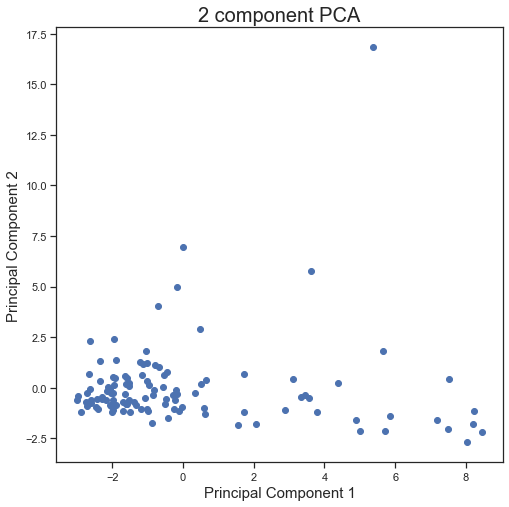

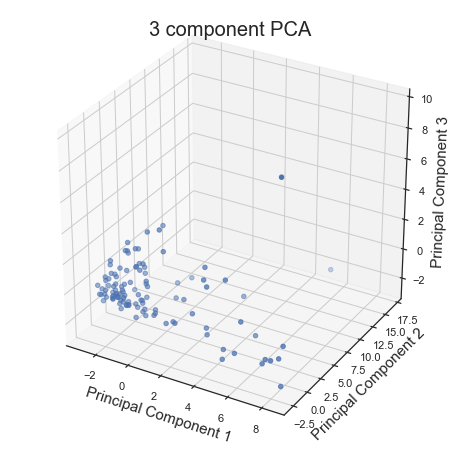

In [222]:
plotpca_2_3(principalDf_2, 2)
plotpca_2_3(principalDf_3, 3)

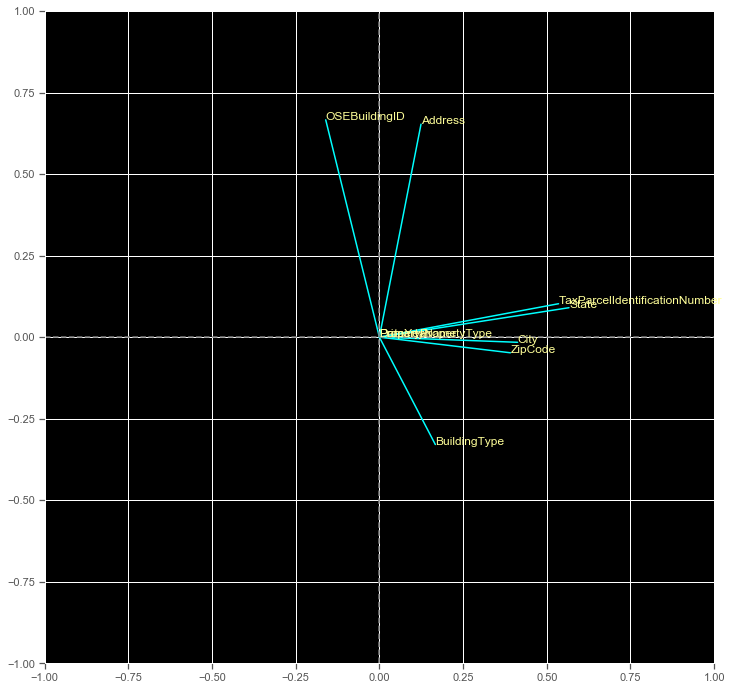

In [242]:
pcs = pca_2.components_
PCA_plot(pcs,data_2016,0,1)

# Concaténation des 2 datasets: 

Skewness: 17.121821
Kurtosis: 401.528520


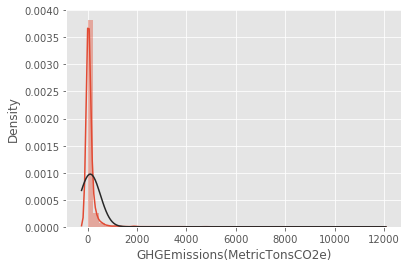

In [16]:
from scipy.stats import norm
#skewness: c'est un coefficient d'asymétrie correspant à une mesure de l'asymetrie de la distribution d'une variable aléatoire réelle 
# puisque skewness=0.00 donc la distribution est symétrique
# kurtosis= coefficient d'aplatissement 
print("Skewness: %f"% data_2015['GHGEmissions(MetricTonsCO2e)'].skew())
print("Kurtosis: %f"% data_2015['GHGEmissions(MetricTonsCO2e)'].kurt())
# afficher la distribution graphique d'une variable quantitative
#histogram 
sns.distplot(data_2015['GHGEmissions(MetricTonsCO2e)'].dropna(), fit = norm)
plt.show()

Skewness: 19.481875
Kurtosis: 474.892223


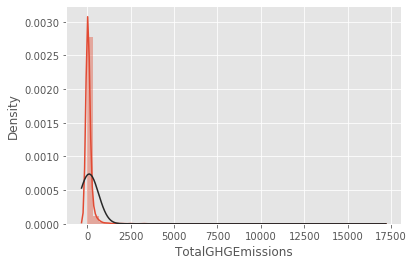

In [18]:
print("Skewness: %f"% data_2016['TotalGHGEmissions'].skew())
print("Kurtosis: %f"% data_2016['TotalGHGEmissions'].kurt())
# afficher la distribution graphique d'une variable quantitative
#histogram 
sns.distplot(data_2016['TotalGHGEmissions'].dropna(), fit = norm)
plt.show()

In [6]:
def inter(lst1, lst2): 
    lst3 = [value for value in lst1 if value not in lst2] 
    lst4= [value for value  in lst2 if value not in lst1] 
    return lst3, lst4
df_2015, df_2016= inter(data_2015.columns, data_2016.columns)
df_2015, df_2016

(['Location',
  'OtherFuelUse(kBtu)',
  '2010 Census Tracts',
  'Seattle Police Department Micro Community Policing Plan Areas',
  'City Council Districts',
  'SPD Beats'],
 ['Address', 'City', 'State', 'Latitude', 'Longitude'])

In [19]:
# Afficher les colonnes qui sont dans data_2016 et qui ne sont pas dans data_2015 
data_2015.rename(columns={'Comment': 'Comments', 'GHGEmissions(MetricTonsCO2e)': 'TotalGHGEmissions', 'GHGEmissionsIntensity(kgCO2e/ft2)':'GHGEmissionsIntensity',  'Zip Codes': 'ZipCode' }, inplace=True)
df_2015, df_2016= inter(data_2015.columns, data_2016.columns)
print(df_2015+ df_2016)

['Location', 'OtherFuelUse(kBtu)', '2010 Census Tracts', 'Seattle Police Department Micro Community Policing Plan Areas', 'City Council Districts', 'SPD Beats', 'Address', 'City', 'State', 'Latitude', 'Longitude']


In [32]:
data= pd.concat([data_2015, data_2016])
data.columns

Index(['OSEBuildingID', 'DataYear', 'BuildingType', 'PrimaryPropertyType',
       'PropertyName', 'TaxParcelIdentificationNumber', 'Location',
       'CouncilDistrictCode', 'Neighborhood', 'YearBuilt', 'NumberofBuildings',
       'NumberofFloors', 'PropertyGFATotal', 'PropertyGFAParking',
       'PropertyGFABuilding(s)', 'ListOfAllPropertyUseTypes',
       'LargestPropertyUseType', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA',
       'YearsENERGYSTARCertified', 'ENERGYSTARScore', 'SiteEUI(kBtu/sf)',
       'SiteEUIWN(kBtu/sf)', 'SourceEUI(kBtu/sf)', 'SourceEUIWN(kBtu/sf)',
       'SiteEnergyUse(kBtu)', 'SiteEnergyUseWN(kBtu)', 'SteamUse(kBtu)',
       'Electricity(kWh)', 'Electricity(kBtu)', 'NaturalGas(therms)',
       'NaturalGas(kBtu)', 'OtherFuelUse(kBtu)', 'TotalGHGEmissions',
       'GHGEmissionsIntensity', 'DefaultData', 'Comments', 'ComplianceStatus',

Skewness: 19.274637
Kurtosis: 489.471674


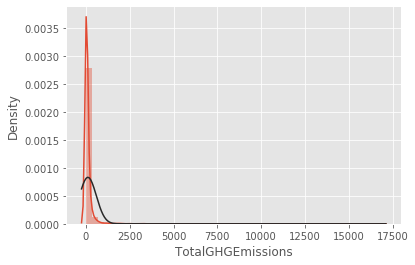

In [21]:
print("Skewness: %f"% data['TotalGHGEmissions'].skew())
print("Kurtosis: %f"% data['TotalGHGEmissions'].kurt())
# afficher la distribution graphique d'une variable quantitative
#histogram 
sns.distplot(data['TotalGHGEmissions'].dropna(), fit = norm)
plt.show()

In [33]:
data_clean= data.drop(columns=['PropertyName', 'DataYear', 'ListOfAllPropertyUseTypes' , 'TaxParcelIdentificationNumber','LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeGFA',
       'ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeGFA', 'ZipCode'] + df_2015+ df_2016)
data_clean.to_csv("data_clean.csv", index=False)

In [34]:
data= pd.read_csv("data_clean.csv")
data.head()

,OSEBuildingID,BuildingType,PrimaryPropertyType,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,DefaultData,Comments,ComplianceStatus,Outlier
0,1,NonResidential,Hotel,7,DOWNTOWN,1927,1.0,12.0,88434,0,88434,Hotel,NaN,65.0,78.9,80.3,173.5,175.1,6981428.0,7097539.0,2023032.0,1080307.0,3686160.0,12724.0,1272388.0,249.43,2.64,No,NaN,Compliant,NaN
1,2,NonResidential,Hotel,7,DOWNTOWN,1996,1.0,11.0,103566,15064,88502,Hotel,NaN,51.0,94.4,99.0,191.3,195.2,8354235.0,8765788.0,0.0,1144563.0,3905411.0,44490.0,4448985.0,263.51,2.38,No,NaN,Compliant,NaN
2,3,NonResidential,Hotel,7,DOWNTOWN,1969,1.0,41.0,961990,0,961990,Hotel,NaN,18.0,96.6,99.7,242.7,246.5,73130656.0,75506272.0,19660404.0,14583930.0,49762435.0,37099.0,3709900.0,2061.48,1.92,Yes,NaN,Compliant,NaN
3,5,NonResidential,Hotel,7,DOWNTOWN,1926,1.0,10.0,61320,0,61320,Hotel,NaN,1.0,460.4,462.5,636.3,643.2,28229320.0,28363444.0,23458518.0,811521.0,2769023.0,20019.0,2001894.0,1936.34,31.38,No,NaN,Compliant,High Outlier
4,8,NonResidential,Hotel,7,DOWNTOWN,1980,1.0,18.0,119890,12460,107430,Hotel,NaN,67.0,120.1,122.1,228.8,227.1,14829099.0,15078243.0,0.0,1777841.0,6066245.0,87631.0,8763105.0,507.70,4.02,No,NaN,Compliant,NaN


In [35]:
data["nmbreNan"]= data.iloc[: , :].isnull().sum(axis=1) 

In [36]:
data= data.sort_values(by=["OSEBuildingID"])
ligne_duplicate = data.loc[data.duplicated(["OSEBuildingID"],keep=False)]
print("I existe ",data.shape[0]-ligne_duplicate.shape[0], "lignes non duppliquées dans la dataset")
ligne_duplicate.head()

I existe  148 lignes non duppliquées dans la dataset


,OSEBuildingID,BuildingType,PrimaryPropertyType,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,DefaultData,Comments,ComplianceStatus,Outlier,nmbreNan
0,1,NonResidential,Hotel,7,DOWNTOWN,1927,1.0,12.0,88434,0,88434,Hotel,NaN,65.0,78.900000,80.300000,173.500000,175.100000,6981428.0,7097539.0,2023032.0,1.080307e+06,3686160.0,12724.00000,1272388.0,249.43,2.64,No,NaN,Compliant,NaN,3
3340,1,NonResidential,Hotel,7,DOWNTOWN,1927,1.0,12.0,88434,0,88434,Hotel,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7226362.5,7456910.0,2003882.0,1.156514e+06,3946027.0,12764.52930,1276453.0,249.98,2.83,False,NaN,Compliant,NaN,3
3341,2,NonResidential,Hotel,7,DOWNTOWN,1996,1.0,11.0,103566,15064,88502,Hotel,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8387933.0,8664479.0,0.0,9.504252e+05,3242851.0,51450.81641,5145082.0,295.86,2.86,False,NaN,Compliant,NaN,3
1,2,NonResidential,Hotel,7,DOWNTOWN,1996,1.0,11.0,103566,15064,88502,Hotel,NaN,51.0,94.400000,99.000000,191.300000,195.200000,8354235.0,8765788.0,0.0,1.144563e+06,3905411.0,44490.00000,4448985.0,263.51,2.38,No,NaN,Compliant,NaN,3
2,3,NonResidential,Hotel,7,DOWNTOWN,1969,1.0,41.0,961990,0,961990,Hotel,NaN,18.0,96.600000,99.700000,242.700000,246.500000,73130656.0,75506272.0,19660404.0,1.458393e+07,49762435.0,37099.00000,3709900.0,2061.48,1.92,Yes,NaN,Compliant,NaN,3


In [37]:
data[~((data[['OSEBuildingID']].duplicated(keep=False)) & (data.isnull().any(axis=1)))]
data= data.sort_values(by=["OSEBuildingID", 'nmbreNan'])
data.head()

,OSEBuildingID,BuildingType,PrimaryPropertyType,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,DefaultData,Comments,ComplianceStatus,Outlier,nmbreNan
0,1,NonResidential,Hotel,7,DOWNTOWN,1927,1.0,12.0,88434,0,88434,Hotel,NaN,65.0,78.900000,80.300000,173.500000,175.100000,6981428.0,7097539.0,2023032.0,1.080307e+06,3686160.0,12724.00000,1272388.0,249.43,2.64,No,NaN,Compliant,NaN,3
3340,1,NonResidential,Hotel,7,DOWNTOWN,1927,1.0,12.0,88434,0,88434,Hotel,NaN,60.0,81.699997,84.300003,182.500000,189.000000,7226362.5,7456910.0,2003882.0,1.156514e+06,3946027.0,12764.52930,1276453.0,249.98,2.83,False,NaN,Compliant,NaN,3
3341,2,NonResidential,Hotel,7,DOWNTOWN,1996,1.0,11.0,103566,15064,88502,Hotel,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8387933.0,8664479.0,0.0,9.504252e+05,3242851.0,51450.81641,5145082.0,295.86,2.86,False,NaN,Compliant,NaN,3
1,2,NonResidential,Hotel,7,DOWNTOWN,1996,1.0,11.0,103566,15064,88502,Hotel,NaN,51.0,94.400000,99.000000,191.300000,195.200000,8354235.0,8765788.0,0.0,1.144563e+06,3905411.0,44490.00000,4448985.0,263.51,2.38,No,NaN,Compliant,NaN,3
2,3,NonResidential,Hotel,7,DOWNTOWN,1969,1.0,41.0,961990,0,961990,Hotel,NaN,18.0,96.600000,99.700000,242.700000,246.500000,73130656.0,75506272.0,19660404.0,1.458393e+07,49762435.0,37099.00000,3709900.0,2061.48,1.92,Yes,NaN,Compliant,NaN,3


In [39]:
df= data[~((data[['OSEBuildingID']].duplicated(keep='first')) & (data.isnull().any(axis=1)))]
print(df.shape)
df= df.sort_values(by=["OSEBuildingID", 'nmbreNan'])
df=df.drop(columns=['nmbreNan'])
df.head()

(3432, 32)


,OSEBuildingID,BuildingType,PrimaryPropertyType,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,DefaultData,Comments,ComplianceStatus,Outlier
0,1,NonResidential,Hotel,7,DOWNTOWN,1927,1.0,12.0,88434,0,88434,Hotel,NaN,65.0,78.900000,80.300000,173.500000,175.100000,6981428.0,7097539.0,2023032.0,1.080307e+06,3686160.0,12724.00000,1272388.0,249.43,2.64,No,NaN,Compliant,NaN
3341,2,NonResidential,Hotel,7,DOWNTOWN,1996,1.0,11.0,103566,15064,88502,Hotel,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8387933.0,8664479.0,0.0,9.504252e+05,3242851.0,51450.81641,5145082.0,295.86,2.86,False,NaN,Compliant,NaN
2,3,NonResidential,Hotel,7,DOWNTOWN,1969,1.0,41.0,961990,0,961990,Hotel,NaN,18.0,96.600000,99.700000,242.700000,246.500000,73130656.0,75506272.0,19660404.0,1.458393e+07,49762435.0,37099.00000,3709900.0,2061.48,1.92,Yes,NaN,Compliant,NaN
3,5,NonResidential,Hotel,7,DOWNTOWN,1926,1.0,10.0,61320,0,61320,Hotel,NaN,1.0,460.400000,462.500000,636.300000,643.200000,28229320.0,28363444.0,23458518.0,8.115210e+05,2769023.0,20019.00000,2001894.0,1936.34,31.38,No,NaN,Compliant,High Outlier
3344,8,NonResidential,Hotel,7,DOWNTOWN,1980,1.0,18.0,175580,62000,113580,Hotel,NaN,75.0,114.800003,118.699997,211.399994,215.600006,14172606.0,14656503.0,0.0,1.573449e+06,5368607.0,88039.98438,8803998.0,505.01,2.88,False,NaN,Compliant,NaN


Skewness: 19.150640
Kurtosis: 463.440947


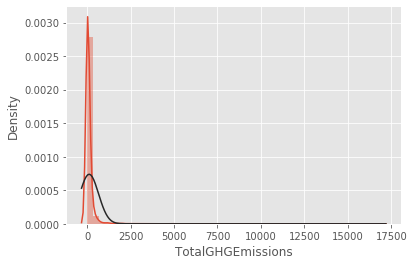

In [41]:
print("Skewness: %f"% df['TotalGHGEmissions'].skew())
print("Kurtosis: %f"% df['TotalGHGEmissions'].kurt())
# afficher la distribution graphique d'une variable quantitative
#histogram 
sns.distplot(df['TotalGHGEmissions'].dropna(), fit = norm)
plt.show()

In [42]:
df.to_csv("data_clean.csv", index=False)

In [45]:
#df.to_csv("clean_data.csv", index=False)
data=pd.read_csv("data_clean.csv")
data.head()

,OSEBuildingID,BuildingType,PrimaryPropertyType,CouncilDistrictCode,Neighborhood,YearBuilt,NumberofBuildings,NumberofFloors,PropertyGFATotal,PropertyGFAParking,PropertyGFABuilding(s),LargestPropertyUseType,YearsENERGYSTARCertified,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEUIWN(kBtu/sf),SourceEUI(kBtu/sf),SourceEUIWN(kBtu/sf),SiteEnergyUse(kBtu),SiteEnergyUseWN(kBtu),SteamUse(kBtu),Electricity(kWh),Electricity(kBtu),NaturalGas(therms),NaturalGas(kBtu),TotalGHGEmissions,GHGEmissionsIntensity,DefaultData,Comments,ComplianceStatus,Outlier
0,1,NonResidential,Hotel,7,DOWNTOWN,1927,1.0,12.0,88434,0,88434,Hotel,NaN,65.0,78.900000,80.300000,173.500000,175.100000,6981428.0,7097539.0,2023032.0,1.080307e+06,3686160.0,12724.00000,1272388.0,249.43,2.64,No,NaN,Compliant,NaN
1,2,NonResidential,Hotel,7,DOWNTOWN,1996,1.0,11.0,103566,15064,88502,Hotel,NaN,61.0,94.800003,97.900002,176.100006,179.399994,8387933.0,8664479.0,0.0,9.504252e+05,3242851.0,51450.81641,5145082.0,295.86,2.86,False,NaN,Compliant,NaN
2,3,NonResidential,Hotel,7,DOWNTOWN,1969,1.0,41.0,961990,0,961990,Hotel,NaN,18.0,96.600000,99.700000,242.700000,246.500000,73130656.0,75506272.0,19660404.0,1.458393e+07,49762435.0,37099.00000,3709900.0,2061.48,1.92,Yes,NaN,Compliant,NaN
3,5,NonResidential,Hotel,7,DOWNTOWN,1926,1.0,10.0,61320,0,61320,Hotel,NaN,1.0,460.400000,462.500000,636.300000,643.200000,28229320.0,28363444.0,23458518.0,8.115210e+05,2769023.0,20019.00000,2001894.0,1936.34,31.38,No,NaN,Compliant,High Outlier
4,8,NonResidential,Hotel,7,DOWNTOWN,1980,1.0,18.0,175580,62000,113580,Hotel,NaN,75.0,114.800003,118.699997,211.399994,215.600006,14172606.0,14656503.0,0.0,1.573449e+06,5368607.0,88039.98438,8803998.0,505.01,2.88,False,NaN,Compliant,NaN


Skewness: 19.150640
Kurtosis: 463.440947


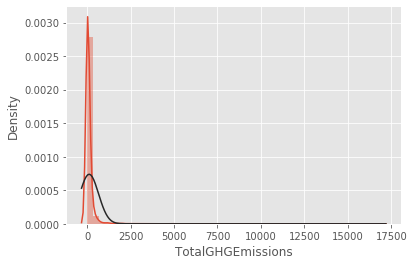

In [46]:
print("Skewness: %f"% data['TotalGHGEmissions'].skew())
print("Kurtosis: %f"% data['TotalGHGEmissions'].kurt())
# afficher la distribution graphique d'une variable quantitative
#histogram 
sns.distplot(data['TotalGHGEmissions'].dropna(), fit = norm)
plt.show()